In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2

In [10]:
junk_thresh = 0.03

marked_image_directory = "full_data/"
clean_image_directory = "cropped_images/"

# Change this line to switch between marked and clean images for step 4.
directory = marked_image_directory

#svm_data_file = "SVM_mid_data.csv"
#forest_data_file = "Forest_mid_data.csv"

svm_data_file = "SVM_feature_data.csv"
forest_data_file = "forest_feature_data.csv"

svm_df = pd.read_csv(svm_data_file)
forest_df = pd.read_csv(forest_data_file)


svm_df.drop(svm_df[svm_df["LeftoverInk"] > junk_thresh].index, inplace=True)
forest_df.drop(forest_df[forest_df["LeftoverInk"] > junk_thresh].index, inplace=True)

og_forest = forest_df

# Only use validation setso we aren't cheating and evaulating on data we trained on
split_point = int(len(forest_df) * .8)
forest_df = forest_df[split_point:]

split_point = int(len(svm_df) * .8)
svm_df = svm_df[split_point:]

# Drop significantly uncircular contours, assume they are mistakes.
forest_df.drop(forest_df[forest_df["Circularity"] < 0.8].index, inplace=True)
svm_df.drop(svm_df[svm_df["Circularity"] < 0.8].index, inplace=True)

7149
7149
1422


c:\users\dh33\appdata\local\programs\python\python37\lib\site-packages\pandas\core\frame.py:4315: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [11]:
def plot_feature_percentiles(truth, feature):
    df = forest_df
    percentile_list = [0.0, 25.0, 50.0, 75.0, 100.0]
    truths = [truth]
    predictions = [feature]

    for i in range(len(predictions)):
        true_zeros = df[df[truths[i]] == 0]
        true_ones = df[df[truths[i]] == 1]
        zero_preds = true_zeros[predictions[i]]
        one_preds = true_ones[predictions[i]]

        zero_percentiles = np.percentile(np.array(zero_preds), percentile_list)
        one_percentiles = np.percentile(np.array(one_preds), percentile_list)

        cols = ["Min", "25th", "50th", "75th", "Max"]
        rows = ["Ground Truth 0", "Ground Truth 1"]

        plt.rcParams.update({'font.size': 32})
        fig, axes = plt.subplots(2, 5, figsize=(30, 15))
        #fig.tight_layout()

        for ax, col in zip(axes[0], cols):
            ax.set_title(col)

        for ax, row in zip(axes[:,0], rows):
            ax.set_ylabel(row, rotation=0, size="large", labelpad=170)

        plt.rcParams.update({'font.size': 42})
        plt.suptitle(predictions[i] + " Prediction Percentiles")
        plt.rcParams.update({'font.size': 32})

        for j in range(len(zero_percentiles)):
            plt.subplot(2, 5, j+1)
            frame = plt.gca()
            frame.axes.get_xaxis().set_ticks([])
            frame.axes.get_yaxis().set_ticks([])
            score = zero_percentiles[j]
            closest = true_zeros.iloc[(true_zeros[predictions[i]] - score).abs().argsort()[:1]]
            filename = list(closest["filename"])[0]
            #print(filename)
            image = cv2.imread(directory + filename)
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            image = cv2.resize(image, (400, 400))
            #plt.axis('off')

            plt.title(cols[j])
            plt.xlabel("Feat. Score " + str("{:.3f}".format(score)))
            plt.imshow(image)

        for j in range(len(one_percentiles)):
            plt.subplot(2, 5, j+6)
            frame = plt.gca()
            frame.axes.get_xaxis().set_ticks([])
            frame.axes.get_yaxis().set_ticks([])
            score = one_percentiles[j]
            closest = true_ones.iloc[(true_ones[predictions[i]] - score).abs().argsort()[:1]]
            filename = list(closest["filename"])[0]
            image = cv2.imread(directory + filename)
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            image = cv2.resize(image, (400, 400))
            #plt.axis('off')
            plt.title(cols[j])
            plt.xlabel("Feat. Score " + str("{:.3f}".format(score)))
            plt.imshow(image)

        plt.savefig("results/plots/" + predictions[i] + "_percentiles.jpg")
        plt.show()

In [12]:
def plot_feature_scores(truth, feature):
    df = forest_df
    percentile_list = [0.0, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, 35.0, 40.0, 45.0, 50.0,
                       55.0, 60.0, 65.0, 70.0, 75.0, 80.0, 85.0, 90.0, 95.0, 100.0]
    truths = [truth]
    features = [feature]

    for i in range(len(features)):
        scores = df[truths[i]]
        feature_values = df[features[i]]

        feature_percentiles = np.percentile(np.array(feature_values), percentile_list)
        print("MIN: " + str(feature_percentiles[0]))
        print("20th: " + str(feature_percentiles[4]))
        print("40th: " + str(feature_percentiles[8]))
        print("60th: " + str(feature_percentiles[12]))
        print("80th: " + str(feature_percentiles[16]))
        print("MAX: " + str(feature_percentiles[-1]))
        percentile_scores = []
        for j in range(len(feature_percentiles)):
            closest = forest_df[np.abs(forest_df[features[i]] - feature_percentiles[j]) < 0.05] 
            percentile_scores.append(np.mean(closest[truths[i]]))
        
        plt.rcParams.update({'font.size': 16})
        plt.plot(percentile_list, percentile_scores, label="Mean Predicted Score")
        #plt.plot(percentile_list, feature_percentiles, label="Feature Value")
        plt.title("Predicted " + truths[i] + " score vs. " + features[i] + " value")
        plt.ylabel("Mean Predicted Score")
        plt.xlabel("Feature Percentile")
        plt.legend(loc="lower right")
        
        plt.savefig("results/plots/" + features[i] + "_value_performance.jpg")
        plt.show()

# 1. Contour

## 1.1 - Circularity (by arc length)

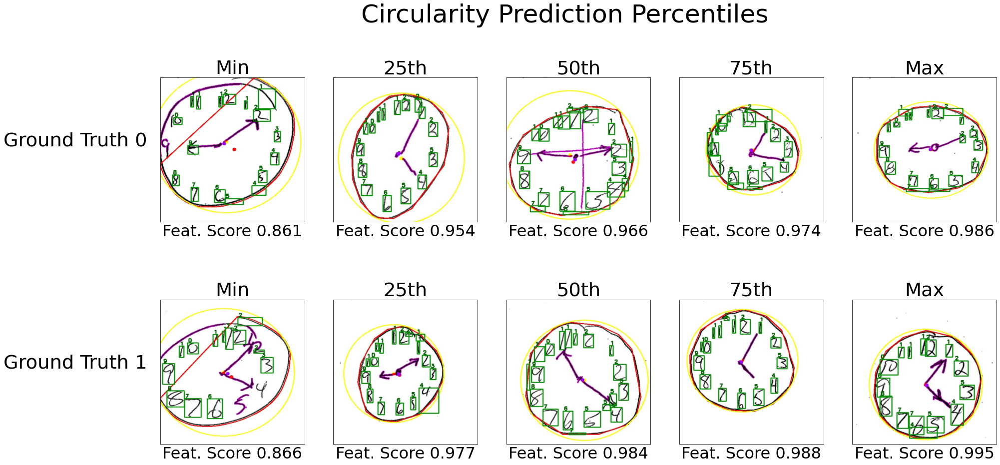

MIN: 0.8614200933955258
20th: 0.9721589894900167
40th: 0.9799039628520959
60th: 0.9846971098464712
80th: 0.988748540411532
MAX: 0.99549058610107


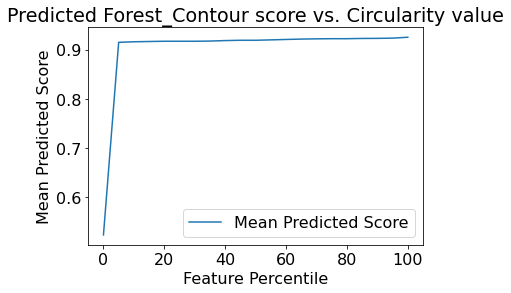

In [13]:
plot_feature_percentiles("ClockContour", "Circularity")
plot_feature_scores("Forest_Contour", "Circularity")

## 1.2 - Radius Ratio

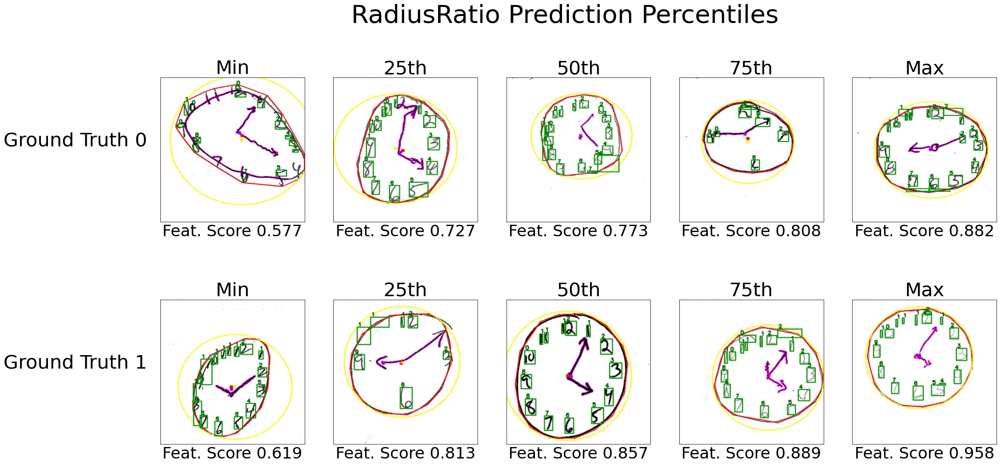

MIN: 0.5766990677996985
20th: 0.7904590191154333
40th: 0.8319447382574678
60th: 0.8638614535242173
80th: 0.892019894514376
MAX: 0.9582956060156852


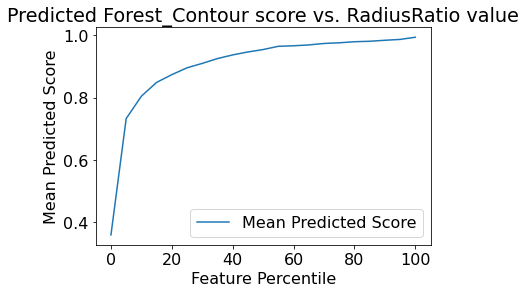

In [14]:
plot_feature_percentiles("ClockContour", "RadiusRatio")
plot_feature_scores("Forest_Contour", "RadiusRatio")

## 1.3 - Radius

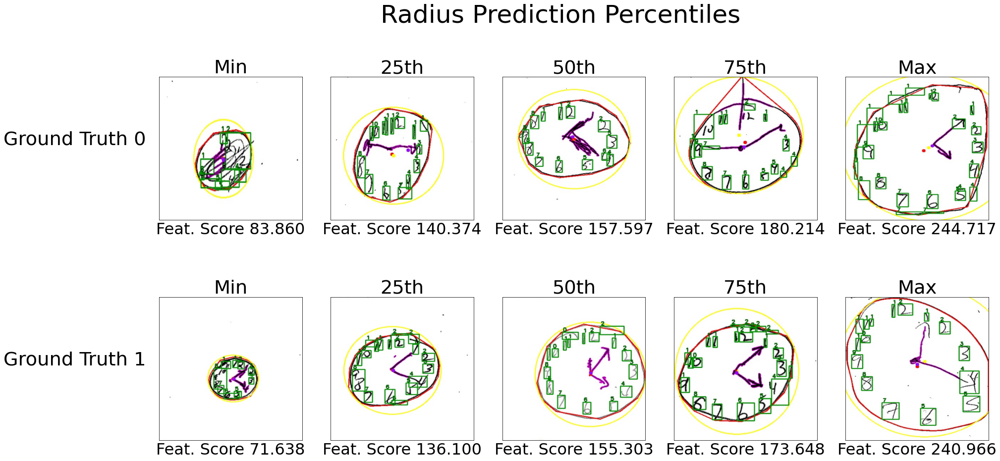

MIN: 71.63796997070312
20th: 131.88645935058594
40th: 148.55372619628906
60th: 162.13042602539062
80th: 179.7050048828125
MAX: 244.71728515625


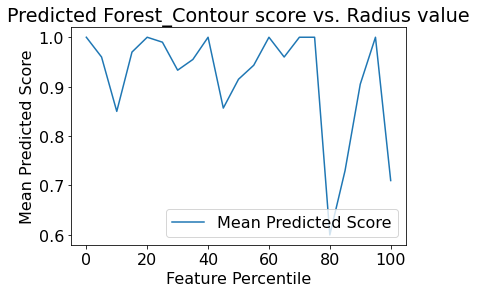

In [15]:
plot_feature_percentiles("ClockContour", "Radius")
plot_feature_scores("Forest_Contour", "Radius")

## 1.4 - Center Deviation

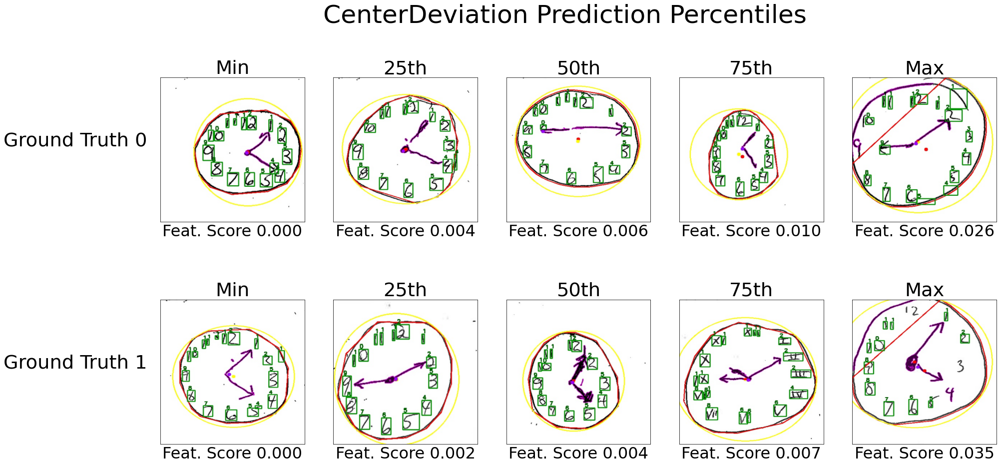

MIN: 0.0
20th: 0.0021493114234033797
40th: 0.0036719860351445005
60th: 0.0053241228746048405
80th: 0.007863950820046779
MAX: 0.0346494439210805


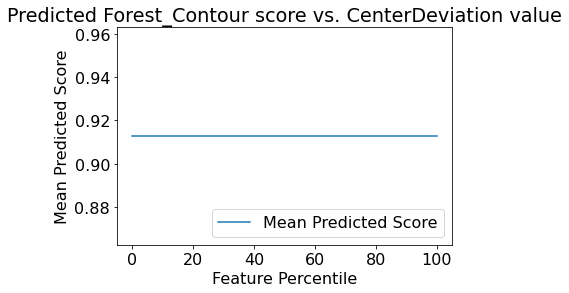

In [16]:
plot_feature_percentiles("ClockContour", "CenterDeviation")
plot_feature_scores("Forest_Contour", "CenterDeviation")

# 2. Hands

## 2.1 - Intersect Distance

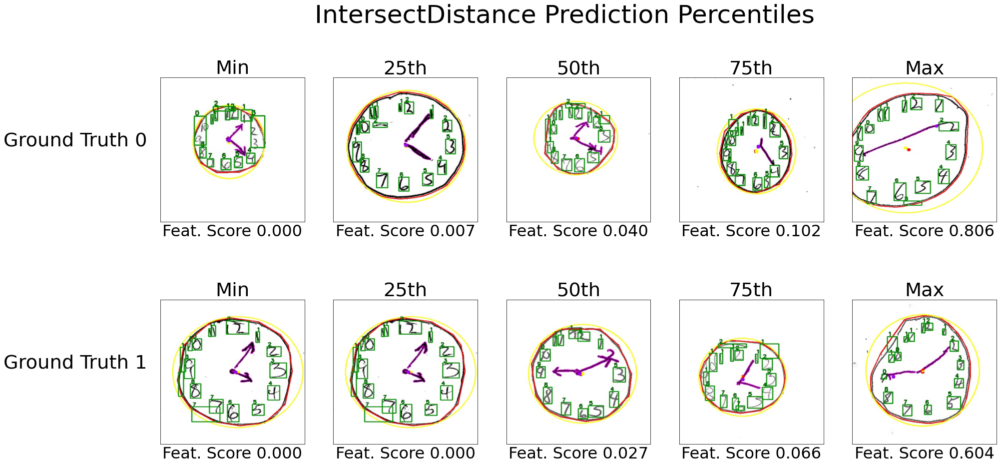

MIN: 0.0
20th: 0.0
40th: 0.0207950097964014
60th: 0.0447213595499957
80th: 0.0986393923832144
MAX: 0.8058233996052433


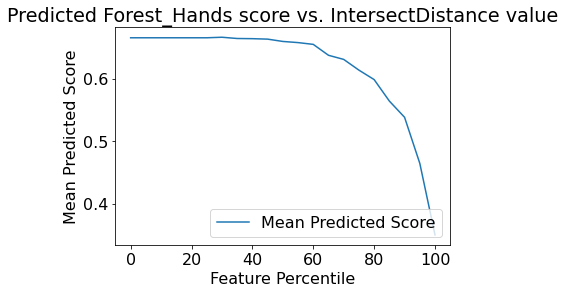

In [17]:
plot_feature_percentiles("ClockHands", "IntersectDistance")
plot_feature_scores("Forest_Hands", "IntersectDistance")

## 2.2 - HandsAngle

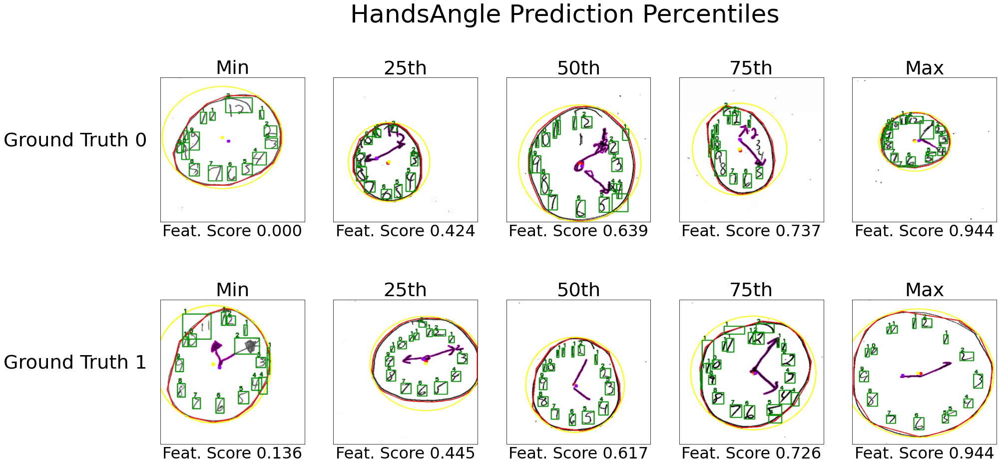

MIN: 0.0
20th: 0.4070796460176991
40th: 0.5457227138643068
60th: 0.672566371681416
80th: 0.7492625368731564
MAX: 0.943952802359882


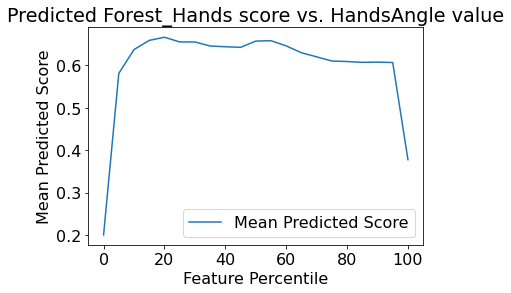

In [18]:
plot_feature_percentiles("ClockHands", "HandsAngle")
plot_feature_scores("Forest_Hands", "HandsAngle")

## 2.3 - Density Ratio

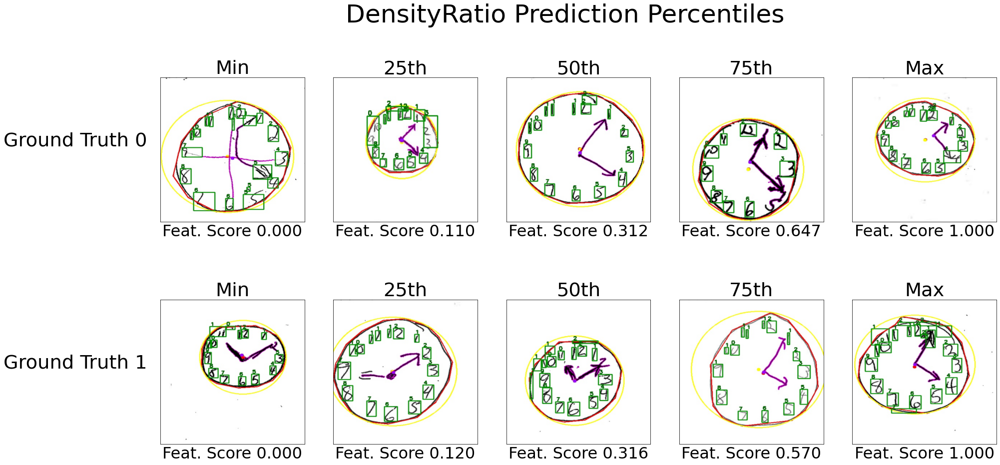

MIN: 0.0
20th: 0.09060417921054967
40th: 0.21989826651495875
60th: 0.42954447216928304
80th: 0.672230304302833
MAX: 1.0


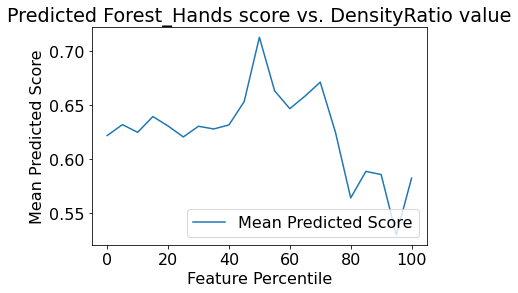

In [19]:
plot_feature_percentiles("ClockHands", "DensityRatio")
plot_feature_scores("Forest_Hands", "DensityRatio")

## 2.4 - Length Ratio

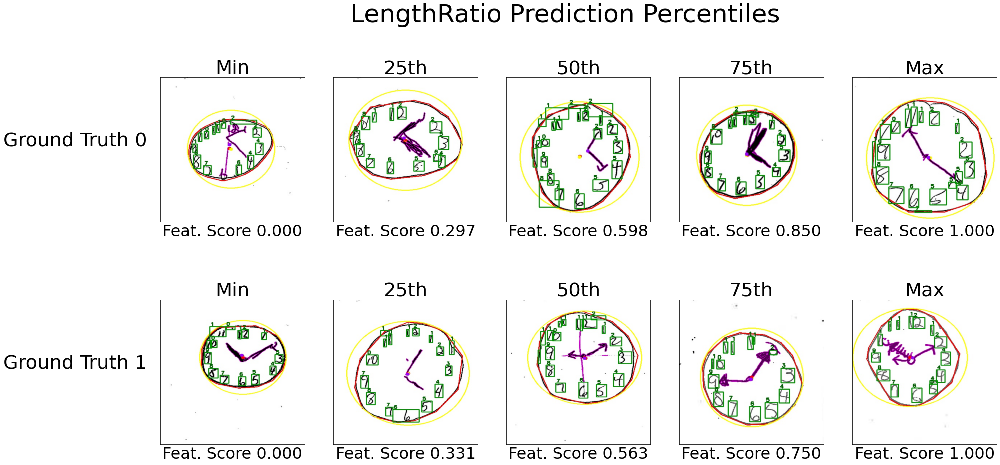

MIN: 0.0
20th: 0.2663717660538171
40th: 0.4832344366089043
60th: 0.6665658370958477
80th: 0.8397464440206985
MAX: 0.9998494618251752


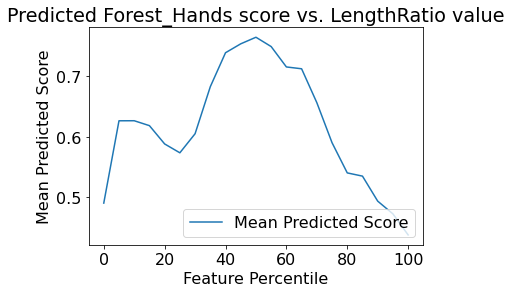

In [20]:
plot_feature_percentiles("ClockHands", "LengthRatio")
plot_feature_scores("Forest_Hands", "LengthRatio")

## 2.5 - Bounding Box Ratio

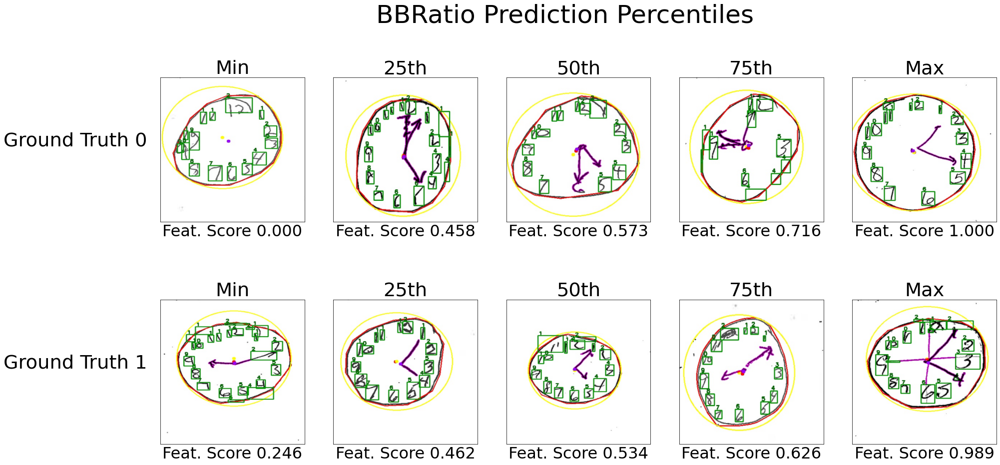

MIN: 0.0
20th: 0.43757396449704145
40th: 0.5136126952640714
60th: 0.5891542506573182
80th: 0.6885320487086846
MAX: 1.0


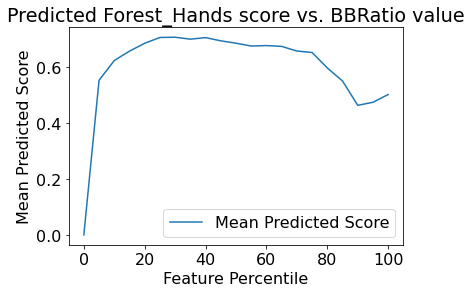

In [21]:
plot_feature_percentiles("ClockHands", "BBRatio")
plot_feature_scores("Forest_Hands", "BBRatio")

## 2.6 - Num Components

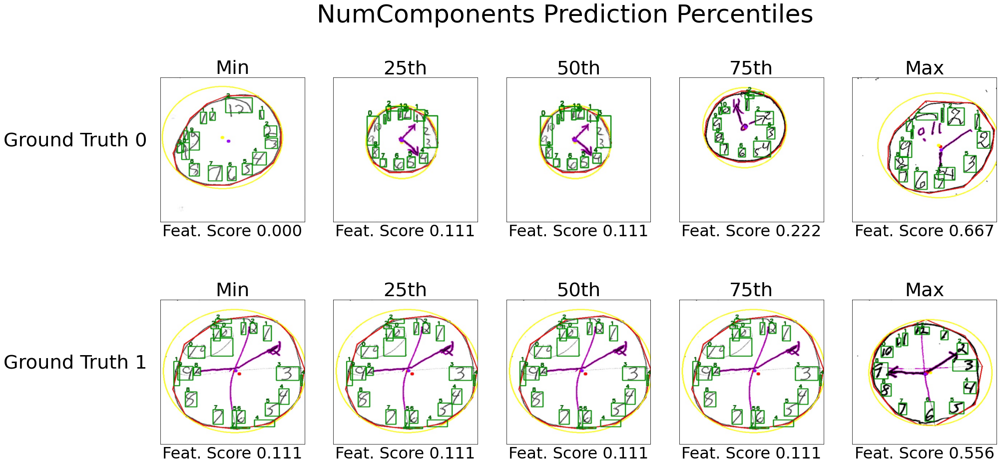

MIN: 0.0
20th: 0.1111111111111111
40th: 0.1111111111111111
60th: 0.1111111111111111
80th: 0.2222222222222222
MAX: 0.6666666666666666


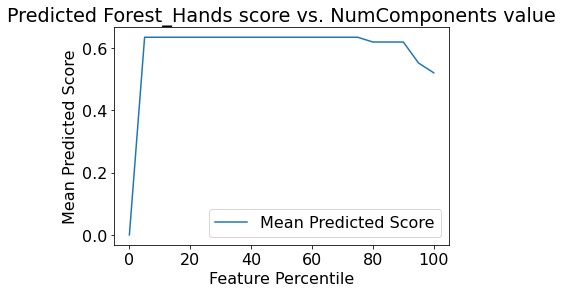

In [22]:
plot_feature_percentiles("ClockHands", "NumComponents")
plot_feature_scores("Forest_Hands", "NumComponents")

# 3. Digits

## 3.1 - Digit Radius Mean

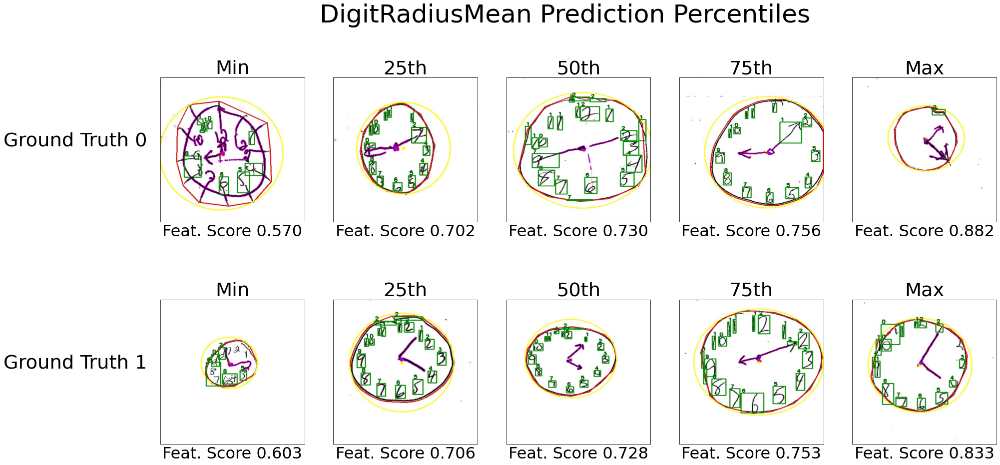

MIN: 0.5695042926716378
20th: 0.6982460799307799
40th: 0.7200531491897338
60th: 0.7377574483076161
80th: 0.758528316642717
MAX: 0.8822545443518028


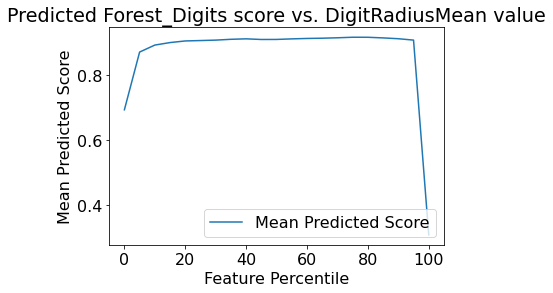

In [23]:
plot_feature_percentiles("ClockNumbers", "DigitRadiusMean")
plot_feature_scores("Forest_Digits", "DigitRadiusMean")

## 3.2 - Digit Radius Std

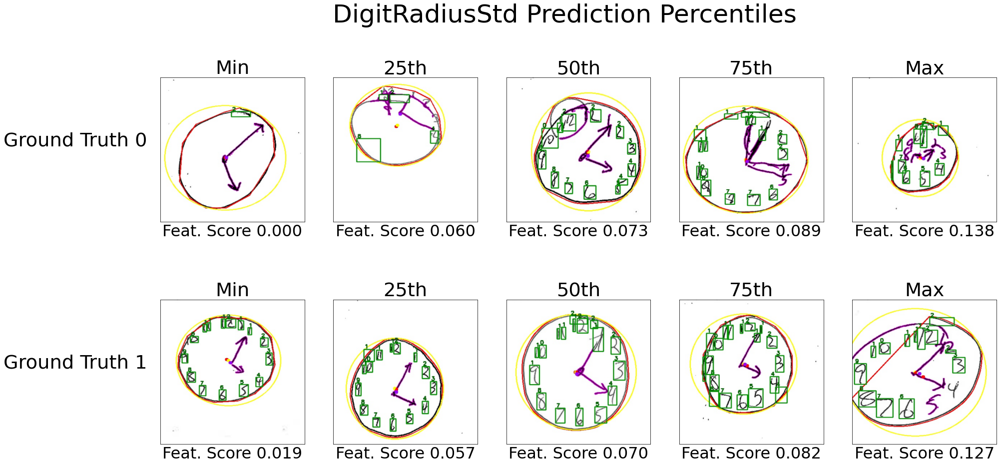

MIN: 0.0
20th: 0.054225574610224085
40th: 0.06498655224265866
60th: 0.07486905756108725
80th: 0.08623265871484172
MAX: 0.1384913394891844


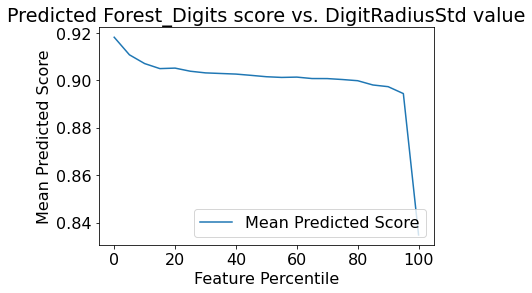

In [24]:
plot_feature_percentiles("ClockNumbers", "DigitRadiusStd")
plot_feature_scores("Forest_Digits", "DigitRadiusStd")

## 3.3 - Digit Angle Mean

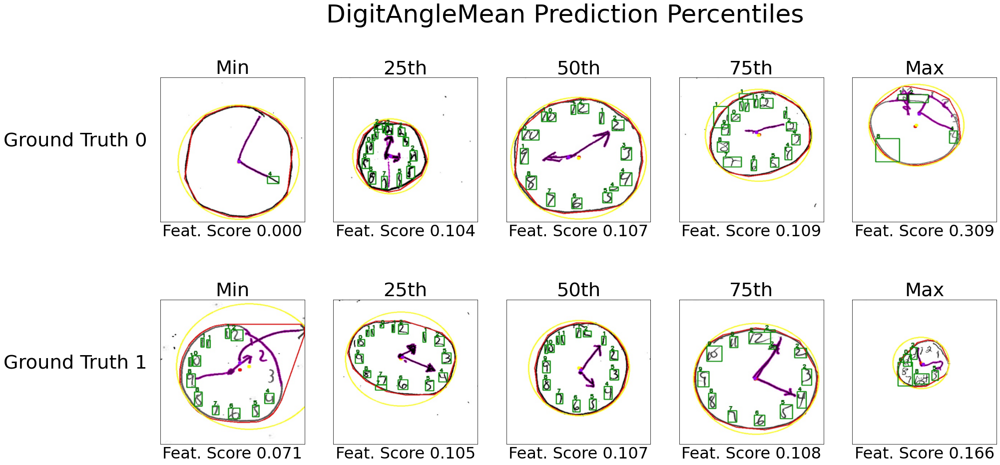

MIN: 0.0
20th: 0.10436332218088551
40th: 0.10604679757549243
60th: 0.10716115886663213
80th: 0.10841944404366952
MAX: 0.3087053121139447


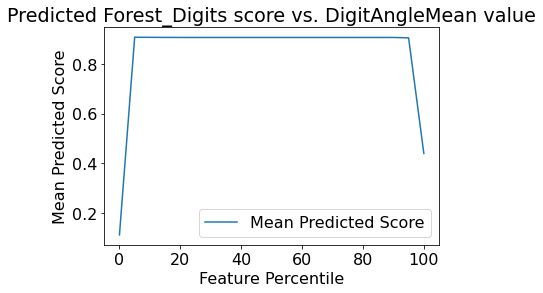

In [25]:
plot_feature_percentiles("ClockNumbers", "DigitAngleMean")
plot_feature_scores("Forest_Digits", "DigitAngleMean")

## 3.4 - Digit Angle Std

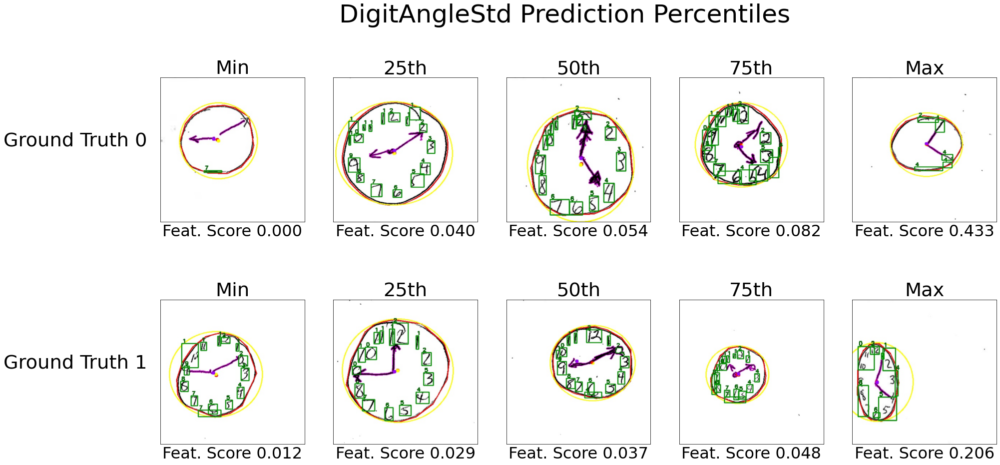

MIN: 0.0
20th: 0.0278418492956325
40th: 0.03518470269777328
60th: 0.04251431906458562
80th: 0.05578341243567494
MAX: 0.4333109282951143


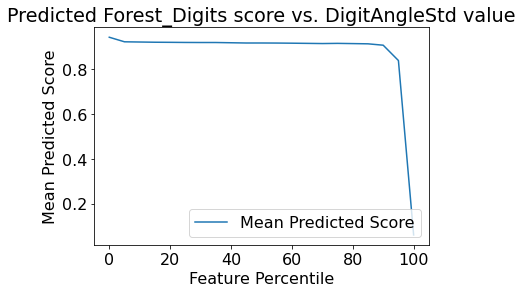

In [26]:
plot_feature_percentiles("ClockNumbers", "DigitAngleStd")
plot_feature_scores("Forest_Digits", "DigitAngleStd")

## 3.5 - Digit Area Mean

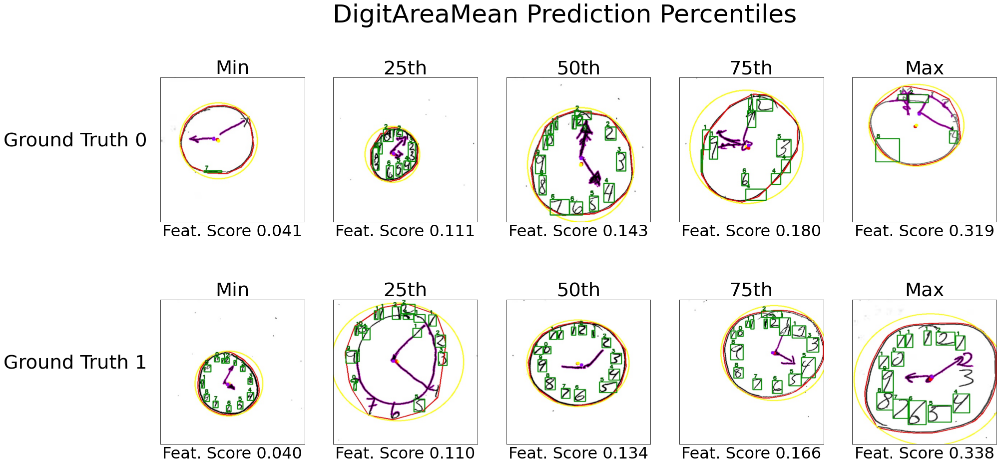

MIN: 0.0400647746114491
20th: 0.1044502222594984
40th: 0.12482317090217782
60th: 0.14644848302926228
80th: 0.17692174020772722
MAX: 0.3381699236769269


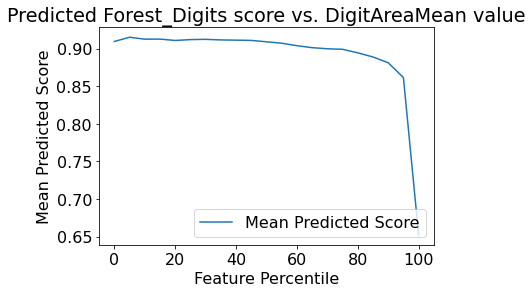

In [27]:
plot_feature_percentiles("ClockNumbers", "DigitAreaMean")
plot_feature_scores("Forest_Digits", "DigitAreaMean")

## 3.6 - Digit Area Std

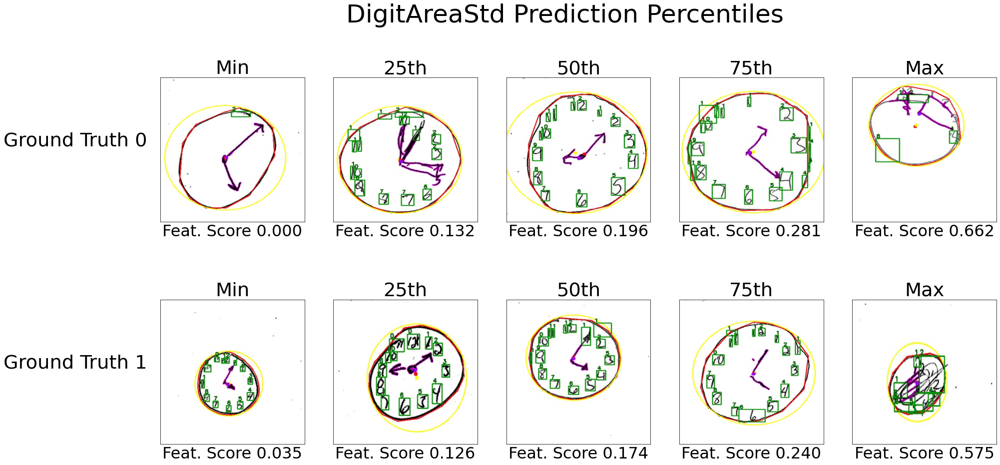

MIN: 0.0
20th: 0.11716369611259074
40th: 0.15546943948647154
60th: 0.19935724243323233
80th: 0.26834667468654866
MAX: 0.6622771699412268


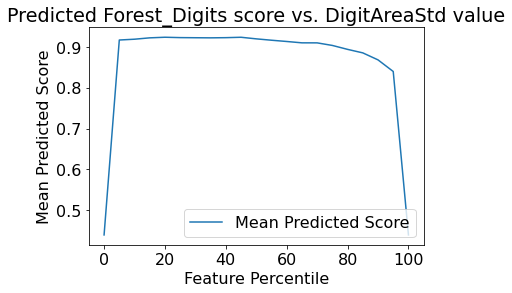

In [28]:
plot_feature_percentiles("ClockNumbers", "DigitAreaStd")
plot_feature_scores("Forest_Digits", "DigitAreaStd")

## 3.7 - Missing Digits

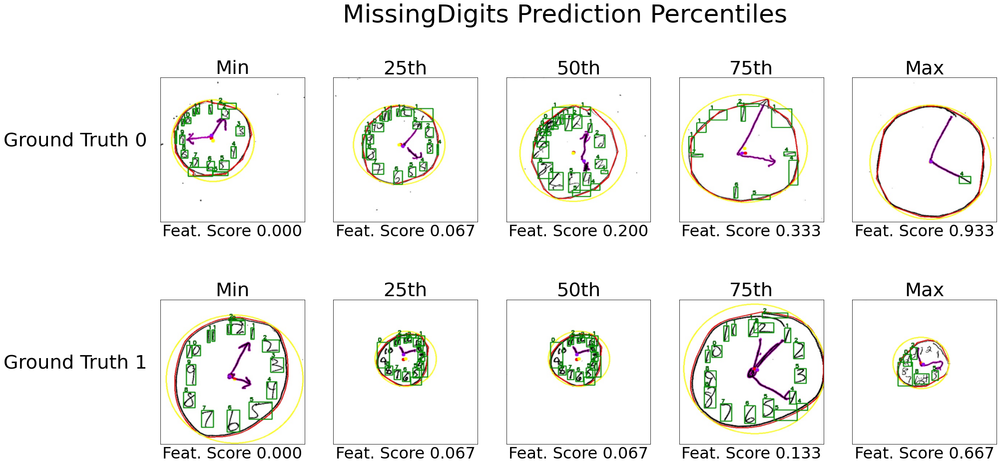

MIN: 0.0
20th: 0.0666666666666666
40th: 0.0666666666666666
60th: 0.1333333333333333
80th: 0.2
MAX: 0.9333333333333332


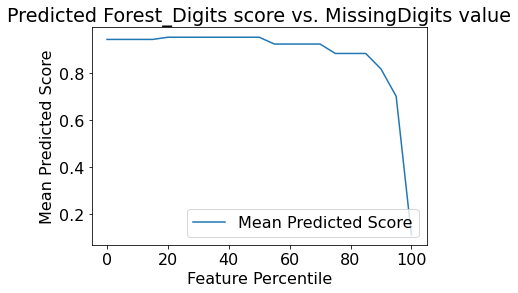

In [29]:
plot_feature_percentiles("ClockNumbers", "MissingDigits")
plot_feature_scores("Forest_Digits", "MissingDigits")

## 3.8 - Extra Digits

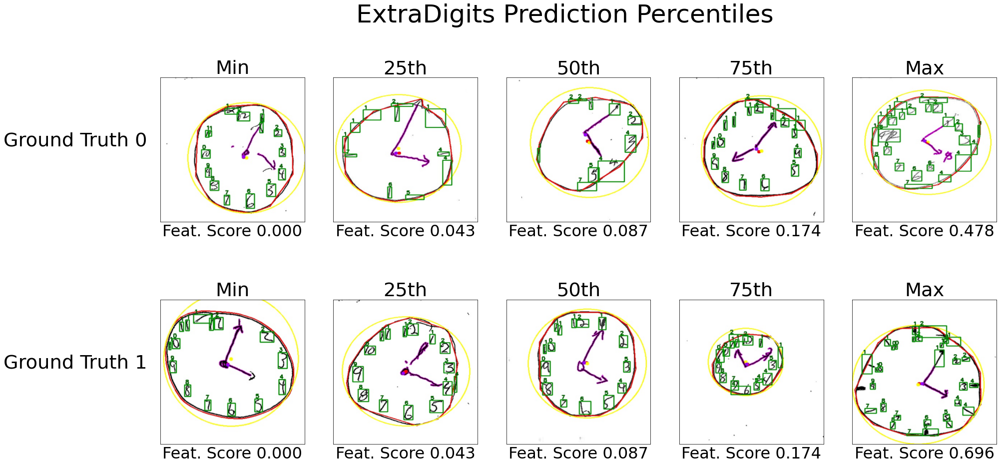

MIN: 0.0
20th: 0.0434782608695652
40th: 0.0869565217391304
60th: 0.1304347826086956
80th: 0.1739130434782608
MAX: 0.6956521739130435


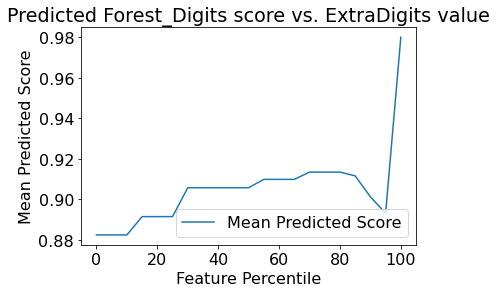

In [30]:
plot_feature_percentiles("ClockNumbers", "ExtraDigits")
plot_feature_scores("Forest_Digits", "ExtraDigits")